In [1]:
import numpy as np
import pandas as pd
import sys
import os
import duckdb
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sys.path.append('..')
from helper import *

setwd()
Objects = Objects()

In [3]:
con = duckdb.connect(database="data/exploitation/exploitation.db", read_only=True)
df = con.execute("SELECT * FROM houses").fetchdf()
con.close

<bound method PyCapsule.close of <duckdb.DuckDBPyConnection object at 0x0000027B8140B970>>

In [4]:
df.head()

,id,url,region,region_url,price,type,sqfeet,beds,baths,cats_allowed,...,nonprofit_hospital,private_hospital,lat:2,long:2,num_schools,num_students,preschool,elementary_school,middle_school,high_school
0,7047341204,https://sanantonio.craigslist.org/apa/d/san-an...,san antonio,https://sanantonio.craigslist.org,933,apartment,949,2,1.0,0,...,14.0,40.0,29.5920,-98.4700,840,502027.0,0.0,0.0,0.0,0.0
1,7050722769,https://sanantonio.craigslist.org/apa/d/one-of...,san antonio,https://sanantonio.craigslist.org,709,apartment,665,1,1.0,0,...,24.0,76.0,29.5042,-98.5697,1662,981156.0,0.0,0.0,0.0,0.0
2,7047297643,https://sanantonio.craigslist.org/apa/d/san-an...,san antonio,https://sanantonio.craigslist.org,874,apartment,987,2,2.0,0,...,77.0,266.0,29.3595,-98.4499,5747,3390961.0,0.0,0.0,0.0,0.0
3,7040844249,https://sanantonio.craigslist.org/apa/d/san-an...,san antonio,https://sanantonio.craigslist.org,906,apartment,950,2,1.0,1,...,12.0,38.0,29.4682,-98.5298,831,488356.0,0.0,0.0,0.0,0.0
4,7050721837,https://sanantonio.craigslist.org/apa/d/san-an...,san antonio,https://sanantonio.craigslist.org,700,apartment,750,2,1.0,0,...,22.0,76.0,29.3466,-98.5074,1644,967702.0,0.0,0.0,0.0,0.0


In [5]:
numeric_description(df)

,mean,std,min,25%,50%,75%,max,missings,missing ratio (%)
id,7.044057e+09,6.263626e+06,7.017886e+09,7.039596e+09,7.045738e+09,7.049608e+09,7.051277e+09,0.0,0.0
price,9.765112e+02,3.364947e+02,1.000000e+00,8.250000e+02,9.450000e+02,1.080000e+03,1.125000e+04,0.0,0.0
sqfeet,8.828068e+02,3.065109e+02,2.600000e+02,6.600000e+02,8.500000e+02,1.007500e+03,3.858000e+03,0.0,0.0
beds,1.753558e+00,8.719143e-01,0.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00,5.000000e+00,0.0,0.0
baths,1.531110e+00,6.850045e-01,0.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,5.500000e+00,0.0,0.0
cats_allowed,7.860919e-01,4.101461e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,0.0
dogs_allowed,7.942253e-01,4.043488e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,0.0
smoking_allowed,9.267995e-01,2.605183e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,0.0
wheelchair_access,4.514030e-02,2.076540e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.0,0.0
electric_vehicle_charge,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0


In [6]:
description_categorical(df)

,,#Levels,"Max Freq (Abs,%)","Min Freq (Abs,%)",#Unknows,Unknows (%)
0,url,2459,https://sanmarcos.craigslist.org/apa/d/unbeata...,https://austin.craigslist.org/apa/d/san-antoni...,0,0.00
1,region,5,"san marcos (1312, 53.36)","killeen / temple / ft hood (1, 0.04)",0,0.00
2,region_url,5,"https://sanmarcos.craigslist.org (1312, 53.36)","https://killeen.craigslist.org (1, 0.04)",0,0.00
3,type,6,"apartment (2331, 94.79)","duplex (1, 0.04)",0,0.00
4,laundry_options,5,"unknow (804, 32.7)","no laundry on site (5, 0.2)",804,32.70
5,parking_options,6,"unknow (1917, 77.96)","detached garage (12, 0.49)",1917,77.96
6,image_url,1020,https://images.craigslist.org/00n0n_ia40kLhuZK...,https://images.craigslist.org/00000_4fgGmWdpy2...,0,0.00
7,description,1947,BALCONES URBAN FLATS Located at 4210 Frederick...,!!!$500 Back in Your Pocket!!! Available to y...,0,0.00
8,state,2,"tx (2456, 99.88)","ut (3, 0.12)",0,0.00


d:\01-Cole\00Master\Q3-ADSDB\ADSDB_project1\notebooks\..\helper.py:122: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(df.corr().applymap(lambda x:round(x,2)), vmax=1.0, vmin=-1.0, center=0, square=True, linewidths=.5, annot=True)


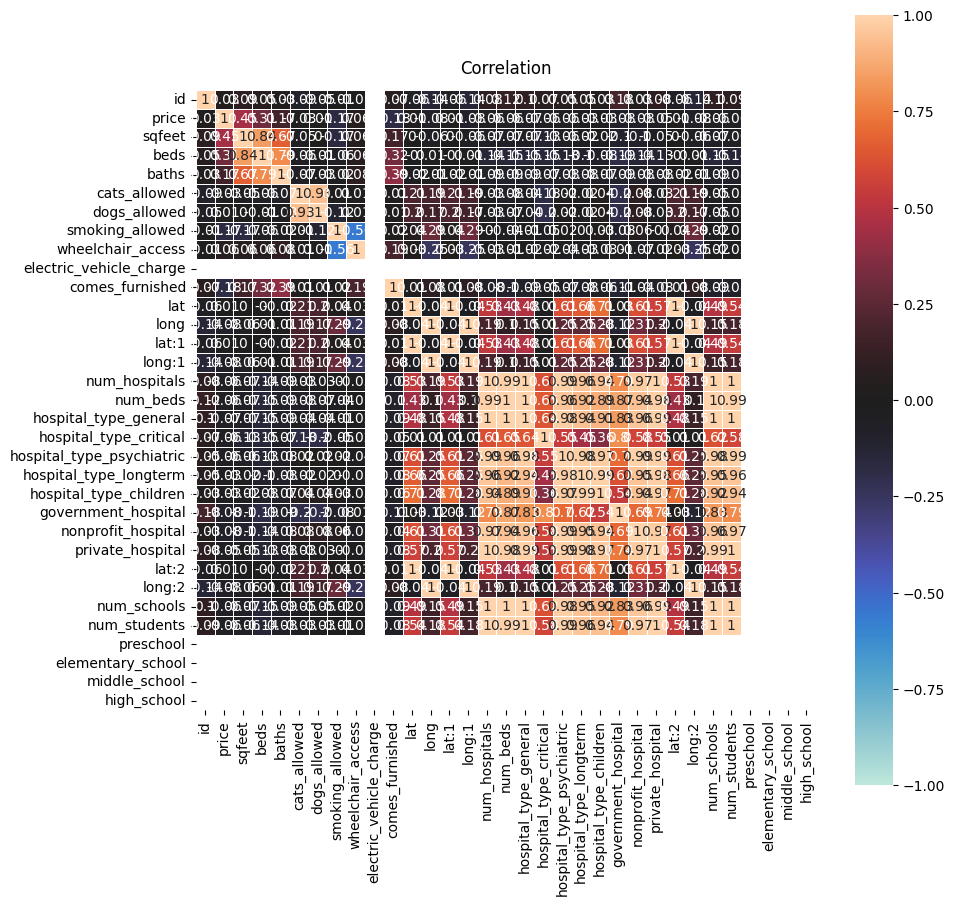

In [7]:
correlation(df)

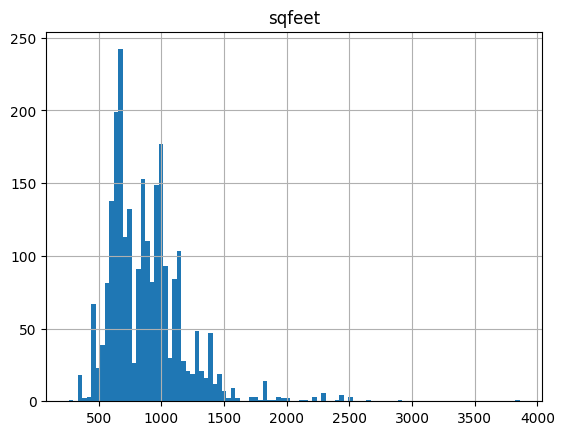

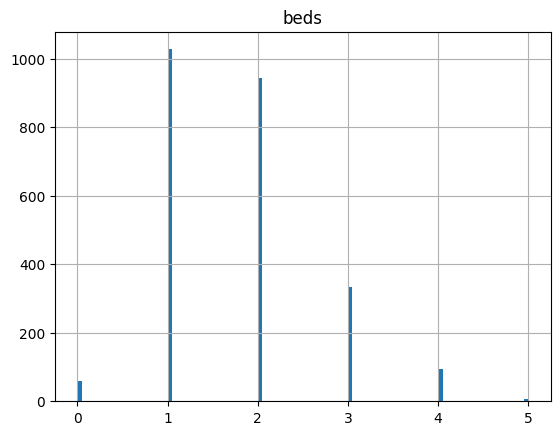

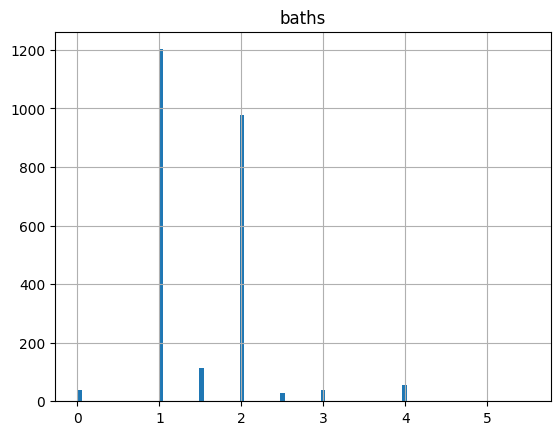

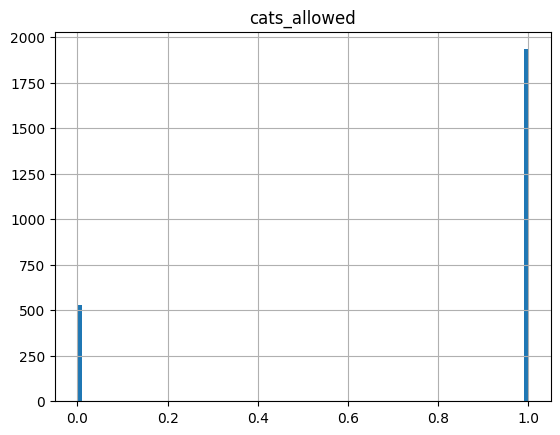

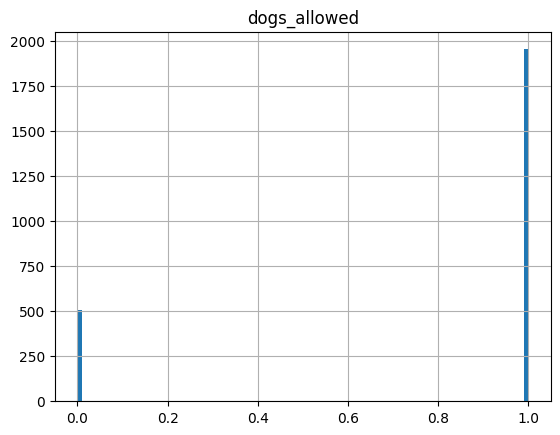

...

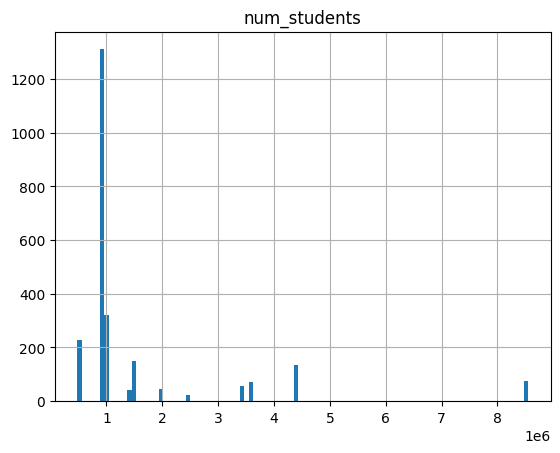

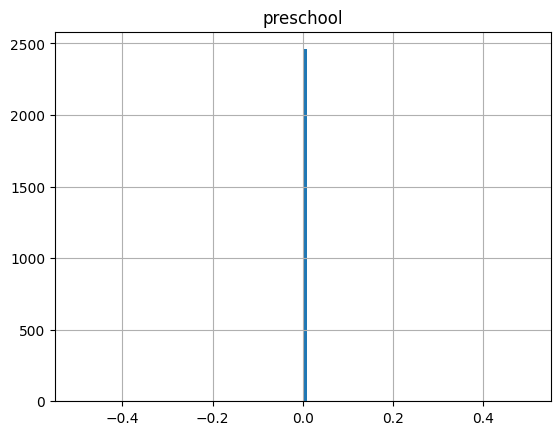

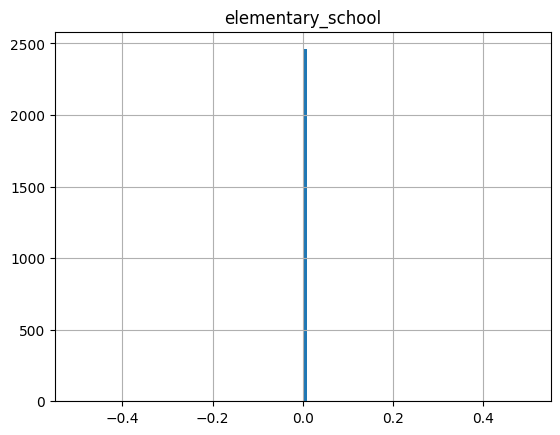

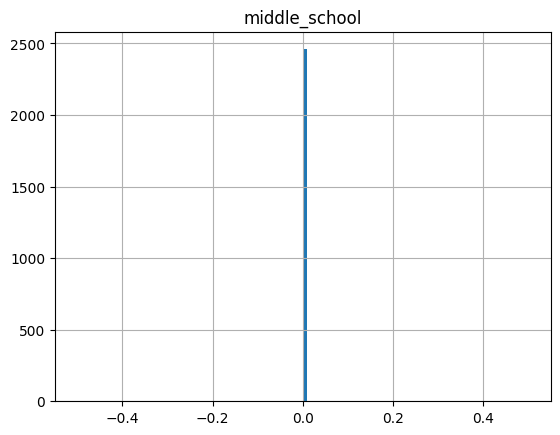

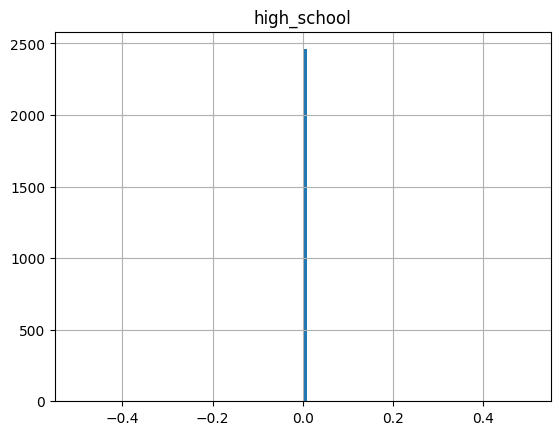

In [8]:
hist(df, bins=100)

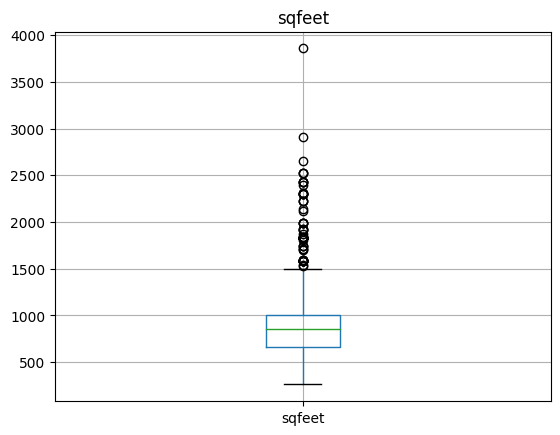

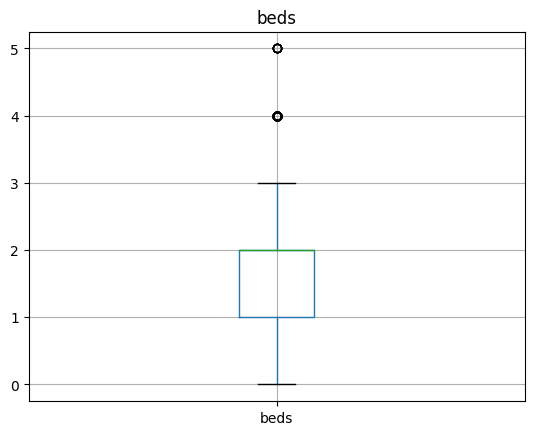

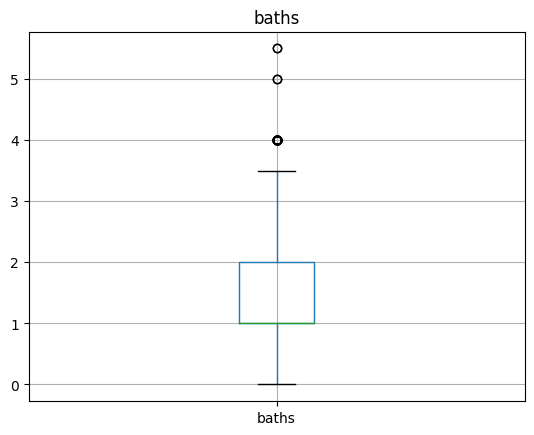

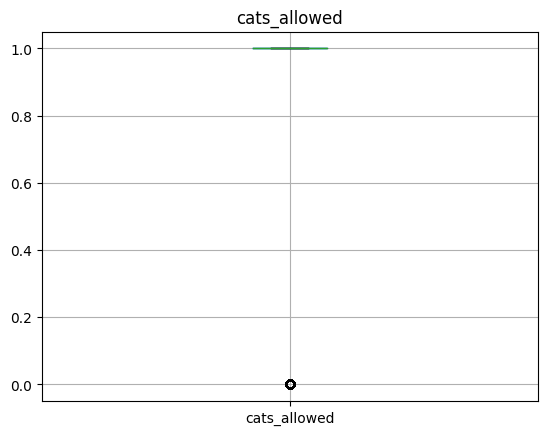

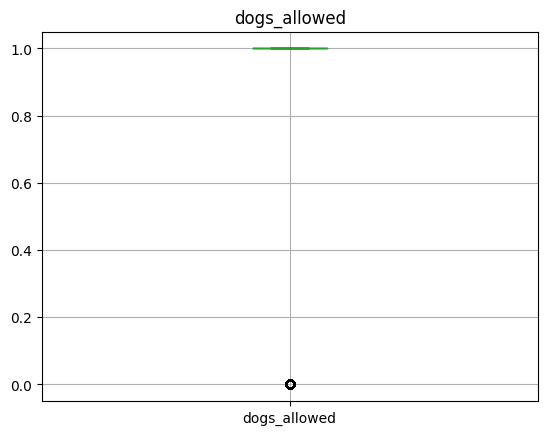

...

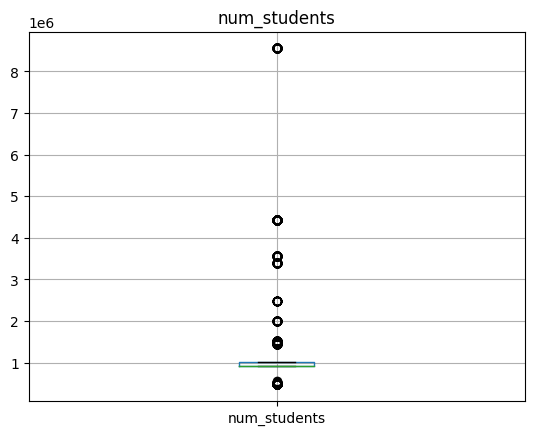

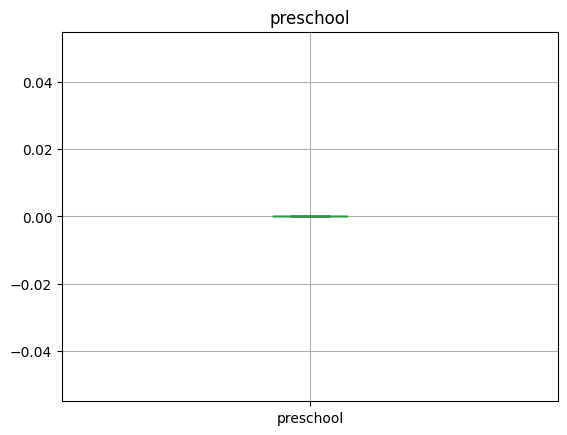

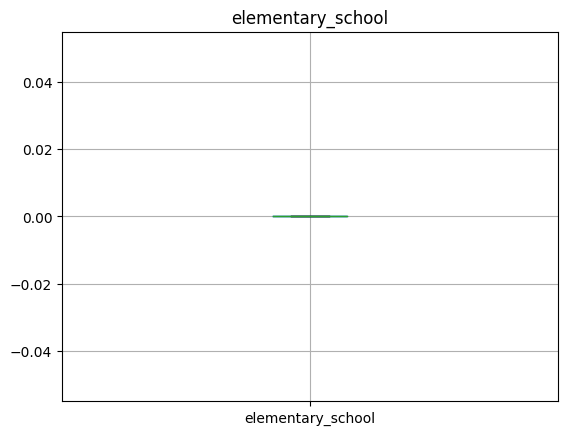

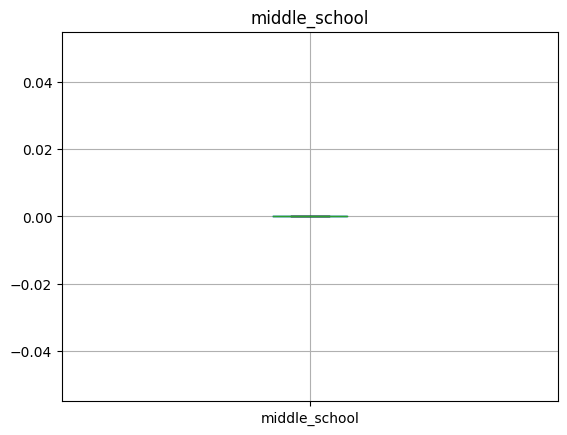

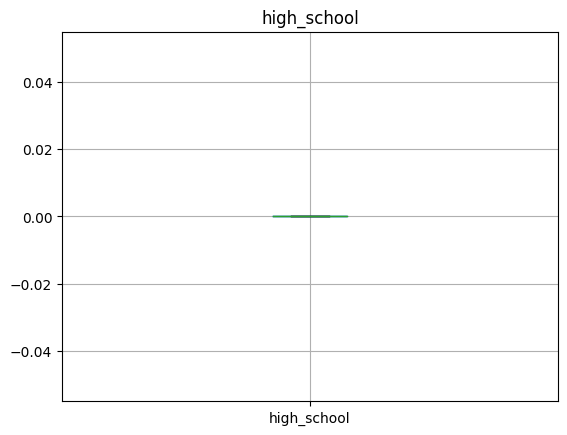

In [9]:
boxplot(df)

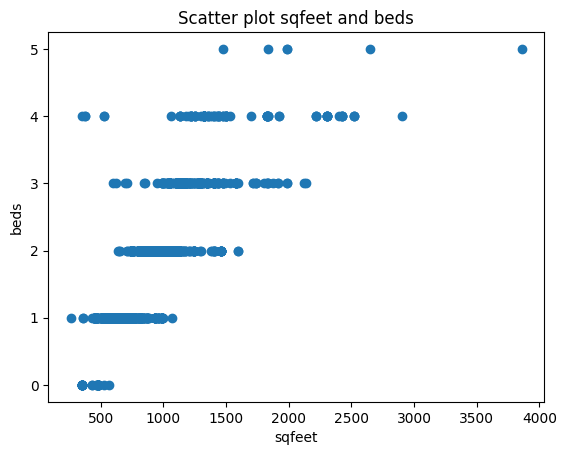

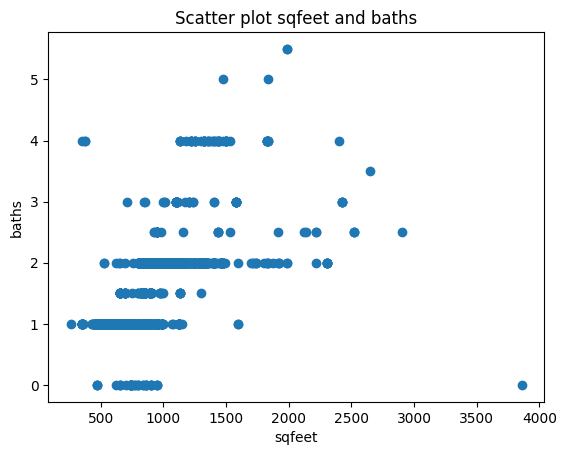

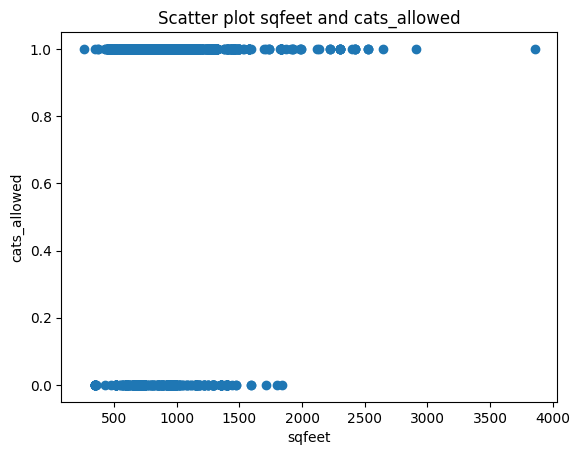

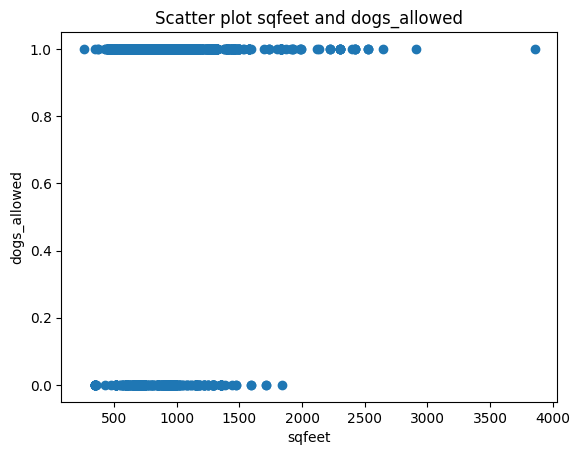

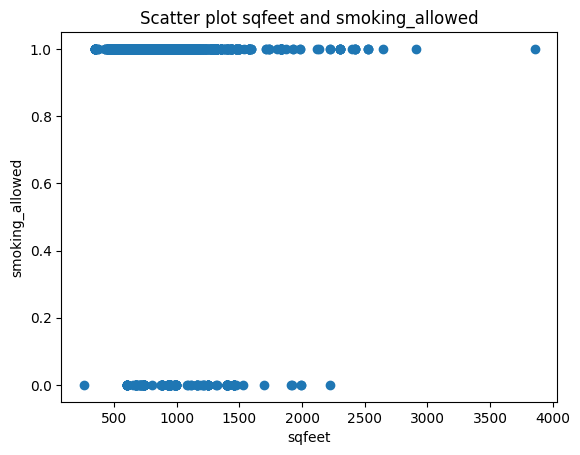

...

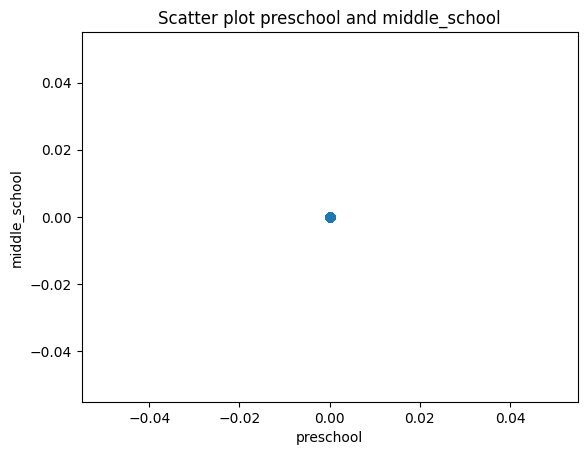

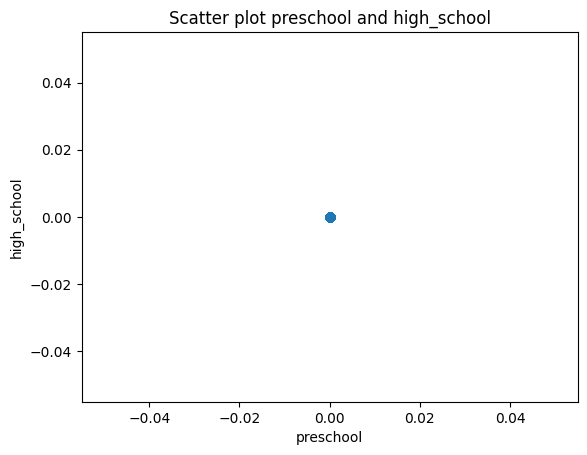

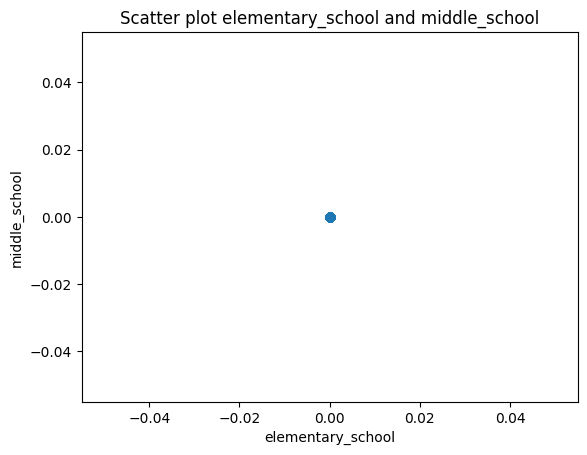

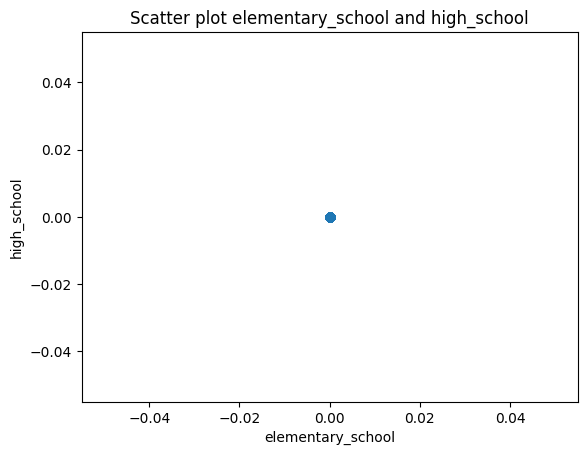

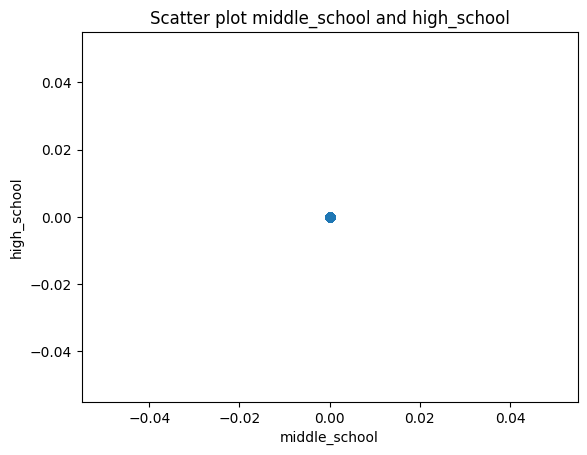

In [10]:
scatter(df)

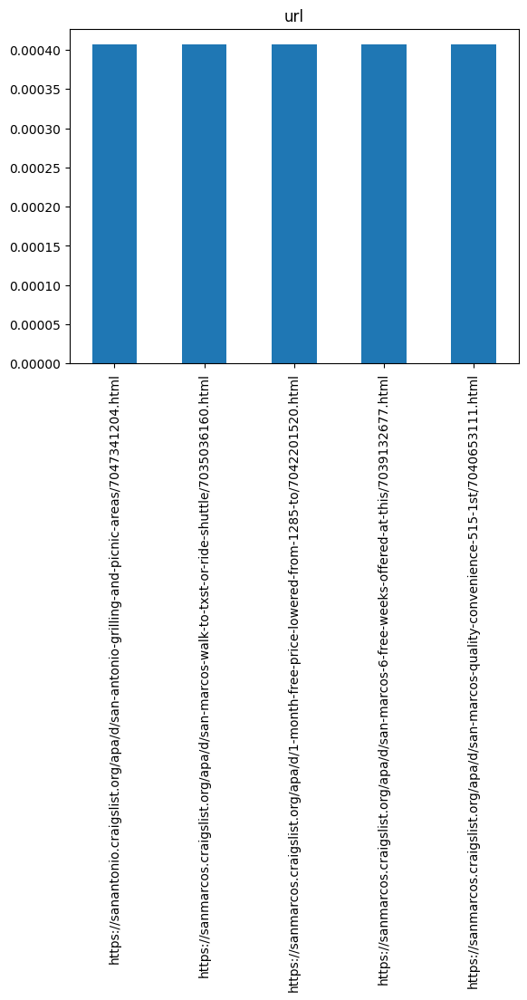

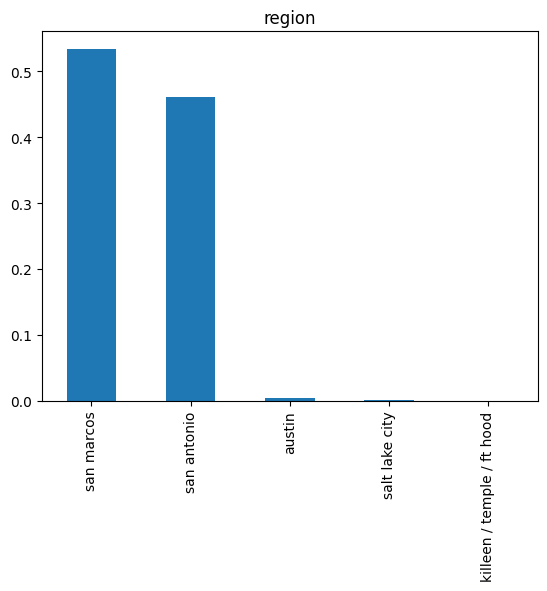

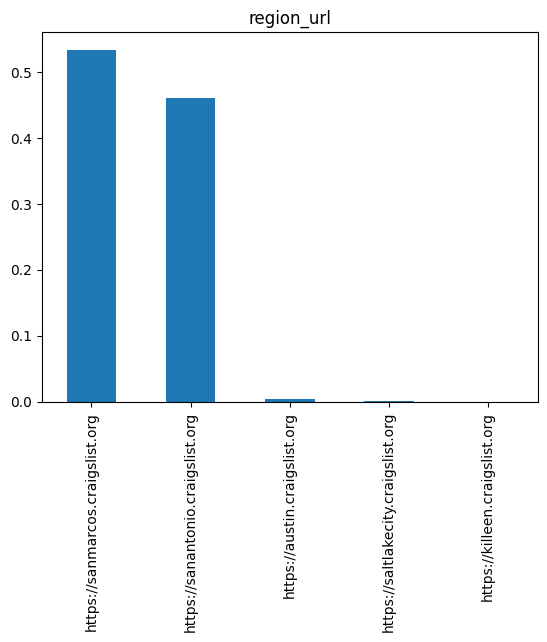

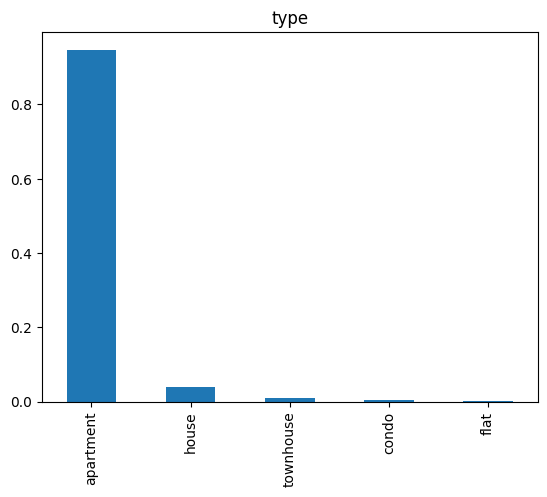

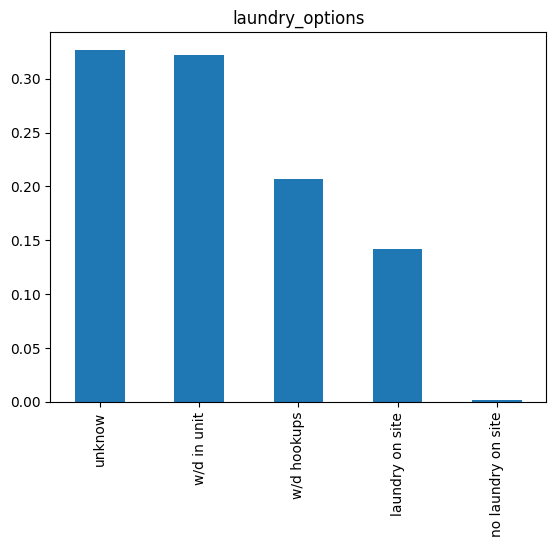

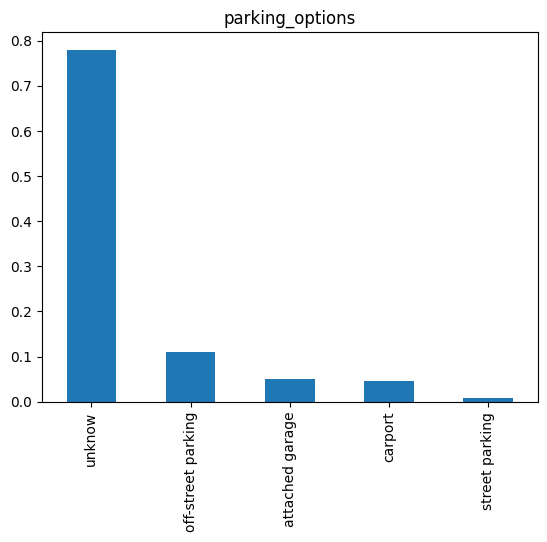

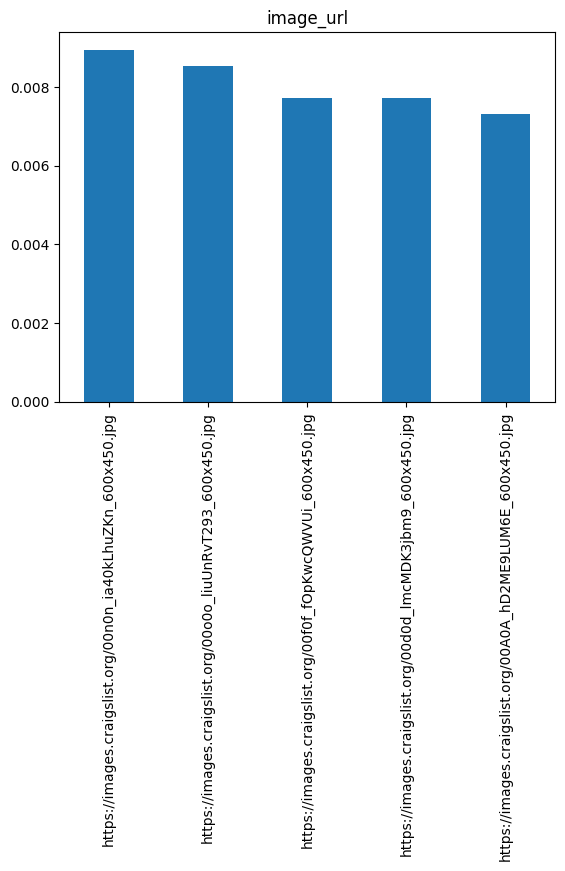

Font 'default' does not have a glyph for '\x9c' [U+9c], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\x94' [U+94], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\x8f' [U+8f], substituting with a dummy symbol.
d:\01-Cole\00Master\Q3-ADSDB\ADSDB_project1\venv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 159 (\x9f) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
d:\01-Cole\00Master\Q3-ADSDB\ADSDB_project1\venv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 148 (\x94) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
d:\01-Cole\00Master\Q3-ADSDB\ADSDB_project1\venv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 154 (\x9a) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
d:\01-Cole\00Master\Q3-ADSDB\ADSDB_project1\venv\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 155 (\x9b) missing

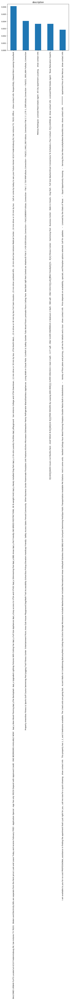

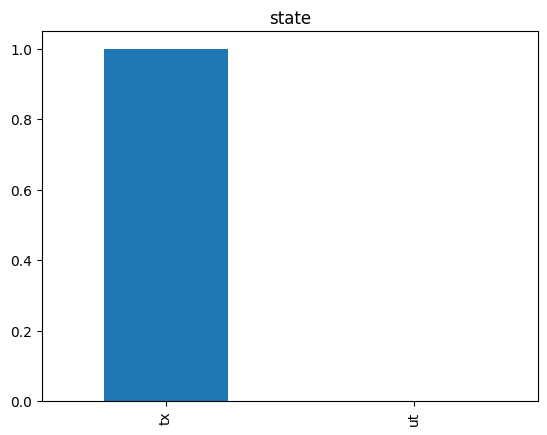

In [11]:
barplot(df,top=5,freq=True)